<a href="https://colab.research.google.com/github/BritneyMuller/colab-notebooks/blob/master/MozCon_GSC_Keywords_%7C_Data_Skeptic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Power Up Your Data Skeptic Skills!!!
[Make a copy of this notebook]
<img src="https://defineawesome.com/wp-content/uploads/superman-doggy.png" width=200 align=right>


✍️ **Keywords:**
- Has the # of ranking keywords gone up or down?
-- *How might this affect other metrics?* 
- What is the ranking distribution of keywords
-- *Has this improved from previous period?*
- What keywords are within "striking distance"?
-- *Keywords with solid CTR but on page two 10-20.*
- What are the new vs lost keywords since previous period?
- How are branded vs nonbrand keywords doing?


🖱️ **Clicks:**
- Are total clicks up from previous period?
- How have top clicked pages changed from previous period?




---



---




# 1) Pull Website Data

- Connect GSC to GDS: Export the 2 keyword tables as CSV: 

https://datastudio.google.com/reporting/53fe5326-d1f7-41a4-8796-b6d65c1215e6

1.  April-keywords.csv
2.  May-keywords.csv

#####**Found this double keyword export to work best for more easily detecting new vs. lost keywords.** 
*—Please let me know if you have a better way of doing this!* 🙏 :)

## Import Libraries

In [ ]:
import csv
import json
import requests
import pandas as pd
import numpy as np
import re
import seaborn as sns
from matplotlib import pyplot as plt

from IPython.display import display

## Upload both CSVs


In [9]:
from google.colab import files
upload = files.upload()

Saving GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (3).csv to GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (3).csv
Saving GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (4).csv to GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (4).csv
Saving GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (5).csv to GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (5).csv


## Name Keyword CSVs to individual dataframes

In [10]:
df = pd.read_csv ("GSC - Data Skeptic Dashboard for SEOs_Page 1_Table.csv")
dfp = pd.read_csv ("GSC - Data Skeptic Dashboard for SEOs_Page 1_Table (1).csv")
#naming this dfp (for dataframe previous) because it makes sense to me... feel free to name whatever you'd like and change the use of dfp below to your naming convection. 💚

Check head (first 5 rows) for each dataframes to ensure upload + naming worked:

In [11]:
df.head()
#May keywords

,Query,Impressions,Clicks,Site CTR,Average Position
0,google kickball,1150,750,0.652174,1.003478
1,chrome dino,125918,612,0.004860,8.268627
2,google merchandise store,14183,514,0.036241,1.031728
3,youtube merchandise,2635,437,0.165844,1.228463
4,google t shirt,1884,353,0.187367,1.002123


In [12]:
#Make sure you know which month's data is in each dataframe
#Add Column with Month info to each dataframe
df = df.assign(Month ='May')
dfp = dfp.assign(Month ='April')

##Do we currently rank for more or less keywords?

In [13]:
#May keywords minus April keywords:
len(df)-len(dfp)

1983

In [ ]:
#You currently rank for 1983 more keywords than you did in April
#Note: This does NOT mean you rank for 1983 NEW KEYWORDS! **we'll get to that :)** 
#Is this good or bad? --Let's try to uncover more info around the quality of keywords

##Outer Join Dataframes


In [14]:
df_outer = pd.merge(df, dfp, on='Query', how='outer')

In [15]:
df_outer.head()

,Query,Impressions_x,Clicks_x,Site CTR_x,Average Position_x,Month_x,Impressions_y,Clicks_y,Site CTR_y,Average Position_y,Month_y
0,google kickball,1150.0,750.0,0.652174,1.003478,May,109.0,74.0,0.678899,1.000000,April
1,chrome dino,125918.0,612.0,0.004860,8.268627,May,162588.0,2150.0,0.013224,7.004213,April
2,google merchandise store,14183.0,514.0,0.036241,1.031728,May,14820.0,621.0,0.041903,1.052294,April
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,May,2729.0,404.0,0.148040,1.827776,April
4,google t shirt,1884.0,353.0,0.187367,1.002123,May,1864.0,343.0,0.184013,1.019313,April


In [16]:
df_outer.tail()

,Query,Impressions_x,Clicks_x,Site CTR_x,Average Position_x,Month_x,Impressions_y,Clicks_y,Site CTR_y,Average Position_y,Month_y
32809,dinosaur game dino,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0,10.666667,April
32810,ok google dinosaurus,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,44.000000,April
32811,jotter goods,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,19.500000,April
32812,andriod logo,NaN,NaN,NaN,NaN,NaN,4.0,0.0,0.0,88.500000,April
32813,ساک سیاه,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,8.000000,April


###Clean up column names

In [17]:
df_outer = df_outer.rename(columns={"Impressions_x":"May Impressions","Clicks_x": "May Clicks", "Site CTR_x": "May CTR", "Average Position_x":"May Rank"})
df_outer = df_outer.rename(columns={"Month_x":"May", "Impressions_y":"April Impressions", "Clicks_y": "April Clicks", "Site CTR_y": "April CTR", "Average Position_y":"April Rank", "Month_y":"April" })


In [18]:
df_outer.head()

,Query,May Impressions,May Clicks,May CTR,May Rank,May,April Impressions,April Clicks,April CTR,April Rank,April
0,google kickball,1150.0,750.0,0.652174,1.003478,May,109.0,74.0,0.678899,1.000000,April
1,chrome dino,125918.0,612.0,0.004860,8.268627,May,162588.0,2150.0,0.013224,7.004213,April
2,google merchandise store,14183.0,514.0,0.036241,1.031728,May,14820.0,621.0,0.041903,1.052294,April
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,May,2729.0,404.0,0.148040,1.827776,April
4,google t shirt,1884.0,353.0,0.187367,1.002123,May,1864.0,343.0,0.184013,1.019313,April


#Gained Keywords

Let's look at our outer join with "NaN" for the month of April (meaning the keyword didn't exist in April) to find out:

In [19]:
df_outer[df_outer['April Rank'].isna()]

,Query,May Impressions,May Clicks,May CTR,May Rank,May,April Impressions,April Clicks,April CTR,April Rank,April
61,google kick ball,57.0,32.0,0.561404,1.000000,May,NaN,NaN,NaN,NaN,NaN
112,グーグルマーチャンダイズストア,18.0,15.0,0.833333,1.111111,May,NaN,NaN,NaN,NaN,NaN
143,/google+redesign/apparel/mens/mens+t+shirts,15.0,12.0,0.800000,1.000000,May,NaN,NaN,NaN,NaN,NaN
167,google camp charleston,77.0,9.0,0.116883,2.259740,May,NaN,NaN,NaN,NaN,NaN
180,googleマーチャンダイズストア,13.0,8.0,0.615385,1.000000,May,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
24909,does ups ship to apo ae,1.0,0.0,0.000000,90.000000,May,NaN,NaN,NaN,NaN,NaN
24911,blacky youtube,1.0,0.0,0.000000,31.000000,May,NaN,NaN,NaN,NaN,NaN
24912,camp charleston,1.0,0.0,0.000000,35.000000,May,NaN,NaN,NaN,NaN,NaN
24913,add logo to sunglasses,1.0,0.0,0.000000,52.000000,May,NaN,NaN,NaN,NaN,NaN


Note: The total number of rows in the bottom left corner (9881 rows x 11 columns) = number of new ranking keywords for May = 9881




#Lost Keywords

In [ ]:
df_outer[df_outer['May Rank'].isna()]

,Query,May Impressions,May Clicks,May CTR,May Rank,May,April Impressions,April Clicks,April CTR,April Rank,April
24916,google+redesign/shop+by+brand/youtube,NaN,NaN,NaN,NaN,NaN,13.0,8.0,0.615385,1.0,April
24917,qwiklabs perk store,NaN,NaN,NaN,NaN,NaN,8.0,7.0,0.875000,1.0,April
24918,google baby onesie,NaN,NaN,NaN,NaN,NaN,11.0,6.0,0.545455,1.0,April
24919,google store clothing,NaN,NaN,NaN,NaN,NaN,10.0,5.0,0.500000,1.0,April
24920,google bag price,NaN,NaN,NaN,NaN,NaN,15.0,5.0,0.333333,1.0,April
...,...,...,...,...,...,...,...,...,...,...,...
32809,will tennyson merch,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.000000,57.0,April
32810,phone stand for desk wood,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.000000,1.0,April
32811,google or,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.000000,66.5,April
32812,sticker cell,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.000000,11.0,April


##Sort lost keywords by clicks


In [21]:
%load_ext google.colab.data_table

#Run code below in green to disable table
#%unload_ext google.colab.data_table
df_outer[df_outer['May Rank'].isna()]

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


,Query,May Impressions,May Clicks,May CTR,May Rank,May,April Impressions,April Clicks,April CTR,April Rank,April
24916,google+redesign/shop+by+brand/youtube,NaN,NaN,NaN,NaN,NaN,13.0,8.0,0.615385,1.000000,April
24917,qwiklabs perk store,NaN,NaN,NaN,NaN,NaN,8.0,7.0,0.875000,1.000000,April
24918,google baby onesie,NaN,NaN,NaN,NaN,NaN,11.0,6.0,0.545455,1.000000,April
24919,google bag price,NaN,NaN,NaN,NaN,NaN,15.0,5.0,0.333333,1.000000,April
24920,google store clothing,NaN,NaN,NaN,NaN,NaN,10.0,5.0,0.500000,1.000000,April
...,...,...,...,...,...,...,...,...,...,...,...
32809,dinosaur game dino,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.000000,10.666667,April
32810,ok google dinosaurus,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.000000,44.000000,April
32811,jotter goods,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.000000,19.500000,April
32812,andriod logo,NaN,NaN,NaN,NaN,NaN,4.0,0.0,0.000000,88.500000,April


#Keyword Rank Distribution:

May Distribution:


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


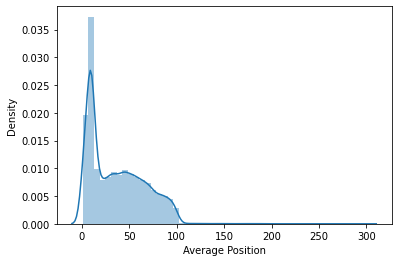

In [26]:
sns.distplot(df['Average Position'])

####April Distribution:
Careful: Notice the X & Y axis change

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


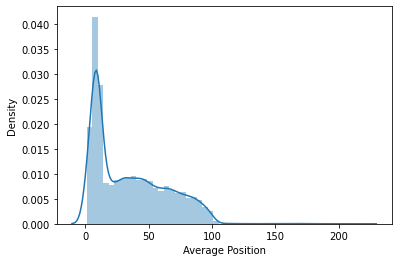

In [27]:
sns.distplot(dfp['Average Position'])

## Add Comparison Columns 

In [28]:
# Rename columns to your preference
#def x(May Impressions, April Impressions)
 # return May Impressions - April Impressions
  
df_outer['Imp Change'] = df_outer['May Impressions'] - df_outer['April Impressions']
df_outer['Clicks Change'] = df_outer['May Clicks'] - df_outer['April Clicks']
#Most people screw up percentage changes...don't be that person! (https://towardsdatascience.com/most-people-screw-up-multiple-percent-changes-heres-how-to-do-get-them-right-b86bd6ef4b72)
#Here we will kind of be that person. Ha! Adding a column for the CTR percentage change via Basis Point 
#(abbreviated as "bps" & commonly referred to as "bips")
df_outer['CTR Change(bps)'] = df_outer['May CTR'] - df_outer['April CTR'] 
df_outer['Rank Change'] = df_outer['May Rank'] - df_outer['April Rank']


df_outer.head()

,Query,May Impressions,May Clicks,May CTR,May Rank,May,April Impressions,April Clicks,April CTR,April Rank,April,Imp Change,Clicks Change,CTR Change(bps),Rank Change
0,google kickball,1150.0,750.0,0.652174,1.003478,May,109.0,74.0,0.678899,1.000000,April,1041.0,676.0,-0.026725,0.003478
1,chrome dino,125918.0,612.0,0.004860,8.268627,May,162588.0,2150.0,0.013224,7.004213,April,-36670.0,-1538.0,-0.008363,1.264414
2,google merchandise store,14183.0,514.0,0.036241,1.031728,May,14820.0,621.0,0.041903,1.052294,April,-637.0,-107.0,-0.005662,-0.020566
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,May,2729.0,404.0,0.148040,1.827776,April,-94.0,33.0,0.017805,-0.599313
4,google t shirt,1884.0,353.0,0.187367,1.002123,May,1864.0,343.0,0.184013,1.019313,April,20.0,10.0,0.003354,-0.017190


Drop Extra Columns like a bad keyword stuffing habit(since we made the change columns) 
Naming this cleaned dataframe "cln"

In [53]:
cln = df_outer.drop(columns=['April Impressions', 'April CTR', 'April Rank', 'April', 'May'])
cln.head()

,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Imp Change,Clicks Change,CTR Change(bps),Rank Change
0,google kickball,1150.0,750.0,0.652174,1.003478,74.0,1041.0,676.0,-0.026725,0.003478
1,chrome dino,125918.0,612.0,0.004860,8.268627,2150.0,-36670.0,-1538.0,-0.008363,1.264414
2,google merchandise store,14183.0,514.0,0.036241,1.031728,621.0,-637.0,-107.0,-0.005662,-0.020566
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,404.0,-94.0,33.0,0.017805,-0.599313
4,google t shirt,1884.0,353.0,0.187367,1.002123,343.0,20.0,10.0,0.003354,-0.017190


##Evaluate the distribution of this dataset
#####Looking at May Clicks below we can observe that only the top 25% of queries have between 0 and 750 clicks. The other 75% have 0.

You can evaluate the rest of the column's distribution by evaluating the min, 25%, 50%, 75%, and max columns.

Don't sleep on the mean & std metrics either!

In [54]:
cln.describe()

,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Imp Change,Clicks Change,CTR Change(bps),Rank Change
count,24916.000000,24916.000000,24916.000000,24916.000000,22933.000000,1.503500e+04,15035.000000,15035.000000,15035.000000
mean,63.422459,0.482943,0.004517,36.646842,1.639908,-1.580815e+02,-1.700898,-0.000850,0.379273
std,1386.260549,9.747134,0.041167,29.054030,90.239312,1.429087e+04,107.364254,0.036644,14.525973
min,1.000000,0.000000,0.000000,1.000000,0.000000,-1.729736e+06,-11629.000000,-1.000000,-102.333333
25%,1.000000,0.000000,0.000000,10.000000,0.000000,-4.000000e+00,0.000000,0.000000,-3.475821
50%,3.000000,0.000000,0.000000,31.000000,0.000000,0.000000e+00,0.000000,0.000000,0.251521
75%,10.000000,0.000000,0.000000,59.000000,0.000000,4.000000e+00,0.000000,0.000000,4.293935
max,125918.000000,750.000000,1.000000,299.000000,11858.000000,1.676300e+04,676.000000,1.000000,135.000000


In [55]:
# Check for null values in the dataset
cln.isnull().sum()

Query                  0
May Impressions     7898
May Clicks          7898
May CTR             7898
May Rank            7898
April Clicks        9881
Imp Change         17779
Clicks Change      17779
CTR Change(bps)    17779
Rank Change        17779
dtype: int64

In [56]:
# Filters to rows where Impressions Difference has a null value
cln[cln['Imp Change'].isnull()]

,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Imp Change,Clicks Change,CTR Change(bps),Rank Change
61,google kick ball,57.0,32.0,0.561404,1.000000,NaN,NaN,NaN,NaN,NaN
112,グーグルマーチャンダイズストア,18.0,15.0,0.833333,1.111111,NaN,NaN,NaN,NaN,NaN
143,/google+redesign/apparel/mens/mens+t+shirts,15.0,12.0,0.800000,1.000000,NaN,NaN,NaN,NaN,NaN
167,google camp charleston,77.0,9.0,0.116883,2.259740,NaN,NaN,NaN,NaN,NaN
180,googleマーチャンダイズストア,13.0,8.0,0.615385,1.000000,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
32809,dinosaur game dino,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
32810,ok google dinosaurus,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
32811,jotter goods,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN
32812,andriod logo,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN


Replace all NaN values in dataset with 0

In [57]:
cln = cln.fillna(0)
cln.isnull().sum()

Query              0
May Impressions    0
May Clicks         0
May CTR            0
May Rank           0
April Clicks       0
Imp Change         0
Clicks Change      0
CTR Change(bps)    0
Rank Change        0
dtype: int64

Explore what data types Pandas considers your columns to be in

In [58]:
cln.dtypes

Query               object
May Impressions    float64
May Clicks         float64
May CTR            float64
May Rank           float64
April Clicks       float64
Imp Change         float64
Clicks Change      float64
CTR Change(bps)    float64
Rank Change        float64
dtype: object

Change Imp Change & Clicks Change to integers for better evaluation

In [59]:
cln['Imp Change'] = cln['Imp Change'].astype('int64')
cln['Clicks Change'] = cln['Clicks Change'].astype('int64')
cln.dtypes

Query               object
May Impressions    float64
May Clicks         float64
May CTR            float64
May Rank           float64
April Clicks       float64
Imp Change           int64
Clicks Change        int64
CTR Change(bps)    float64
Rank Change        float64
dtype: object

#Identify Question Keywords

In [147]:
questions = cln[(cln['Query'].str.contains('(does|who|will|why|what|where|when|how|can|\?|was|were|being|been|versus|vs|vs\.|best)', 
                                           regex=True)==True)]
questions.head(10)

/usr/local/lib/python3.7/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Brand vs Non,Rounded Rank
142,how to get google t shirt,37.0,12.0,0.324324,3.081081,9.0,Brand,3
348,how to get google developer t-shirt for free 2021,58.0,4.0,0.068966,10.896552,4.0,Brand,11
384,how to get google stickers,16.0,3.0,0.187500,2.187500,6.0,Brand,2
422,how much is a google bike worth,25.0,3.0,0.120000,3.040000,4.0,Brand,3
454,how to get google cloud goodies,26.0,2.0,0.076923,5.115385,1.0,Brand,5
548,google store cancel order,70.0,2.0,0.028571,6.828571,0.0,Brand,7
609,how to get google t shirt for free,25.0,1.0,0.040000,6.240000,0.0,Brand,6
622,how long does google fi take to ship,50.0,1.0,0.020000,4.560000,0.0,Brand,5
635,what is google merchandise store,79.0,1.0,0.012658,1.379747,3.0,Brand,1
677,how to get google cloud t-shirt,15.0,1.0,0.066667,3.933333,1.0,Brand,4


In [139]:
 questions.to_csv('All SOA GSC Questions.csv')

#Label Branded Keywords


## Create A New Brand vs Non-Brand Column

In [121]:
#The "google|chrome|youtube" below is regex and can be modified for your data:
cln["Brand vs Non"]=cln.Query.str.contains("google|chrome|youtube")
mask = cln.applymap(type) != bool
d = {True: 'Brand', False: 'Non-Brand'}
cln = cln.where(mask, cln.replace(d))
cln.head(10)

,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Brand vs Non,Rounded Rank
0,google kickball,1150.0,750.0,0.652174,1.003478,74.0,Brand,1
1,chrome dino,125918.0,612.0,0.004860,8.268627,2150.0,Brand,8
2,google merchandise store,14183.0,514.0,0.036241,1.031728,621.0,Brand,1
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,404.0,Brand,1
4,google t shirt,1884.0,353.0,0.187367,1.002123,343.0,Brand,1
5,dino game,67776.0,349.0,0.005149,8.213025,5945.0,Non-Brand,8
6,dino,26171.0,311.0,0.011883,10.461847,819.0,Non-Brand,10
7,youtube merch,2531.0,283.0,0.111814,1.186488,290.0,Brand,1
8,dinosaur game,99671.0,229.0,0.002298,11.257226,11858.0,Non-Brand,11
9,youtube store,1343.0,221.0,0.164557,2.358898,196.0,Brand,2


###Add a rounded rank column

In [99]:
cln['Rounded Rank'] = cln['May Rank'].round(0).astype('int64')
cln.head(30)

,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Brand vs Non,Rounded Rank
0,google kickball,1150.0,750.0,0.652174,1.003478,74.0,Brand,1
1,chrome dino,125918.0,612.0,0.004860,8.268627,2150.0,Brand,8
2,google merchandise store,14183.0,514.0,0.036241,1.031728,621.0,Brand,1
3,youtube merchandise,2635.0,437.0,0.165844,1.228463,404.0,Brand,1
4,google t shirt,1884.0,353.0,0.187367,1.002123,343.0,Brand,1
5,dino game,67776.0,349.0,0.005149,8.213025,5945.0,Non-Brand,8
6,dino,26171.0,311.0,0.011883,10.461847,819.0,Non-Brand,10
7,youtube merch,2531.0,283.0,0.111814,1.186488,290.0,Brand,1
8,dinosaur game,99671.0,229.0,0.002298,11.257226,11858.0,Non-Brand,11
9,youtube store,1343.0,221.0,0.164557,2.358898,196.0,Brand,2


# Keyword Opportunities

In [122]:
cln[(cln['Rounded Rank'] >= 9) & (cln['Rounded Rank'] <= 20)]

,Query,May Impressions,May Clicks,May CTR,May Rank,April Clicks,Brand vs Non,Rounded Rank
6,dino,26171.0,311.0,0.011883,10.461847,819.0,Non-Brand,10
8,dinosaur game,99671.0,229.0,0.002298,11.257226,11858.0,Non-Brand,11
11,dino chrome,19736.0,180.0,0.009120,8.769761,230.0,Brand,9
23,google dino,15872.0,91.0,0.005733,10.169292,562.0,Brand,10
28,dino google,5024.0,79.0,0.015725,9.180334,356.0,Brand,9
...,...,...,...,...,...,...,...,...
24897,கூகுள் சூப்பர்,2.0,0.0,0.000000,9.000000,0.0,Non-Brand,9
24898,astickers,1.0,0.0,0.000000,11.000000,0.0,Non-Brand,11
24904,dino//:chrome,107.0,0.0,0.000000,9.168224,0.0,Brand,9
24905,green android,18.0,0.0,0.000000,18.388889,0.0,Non-Brand,18


In [81]:
#Let's disable the filterable table:
%unload_ext google.colab.data_table
#reload_ext google.colab.data_table to enable again

### CTR Curve
Aggregates the data into pivot tables to create a CTR curve.

##### Total Site

In [82]:
# Creates a pivot table that averages the Site CTR by the Rounded Position. 
ctr_pivot = cln.pivot_table(index=('Rounded Rank'), values=['May CTR'], aggfunc={'May CTR':"mean"}).sort_values(by=['Rounded Rank'], ascending=True)
ctr_pivot.head(10)

,May CTR
Rounded Rank,
0,0.000000
1,0.054850
2,0.033007
3,0.026152
4,0.015025
5,0.013900
6,0.005779
7,0.003231
8,0.005003


Text(0.5, 1.0, 'Total Site CTR Curve')

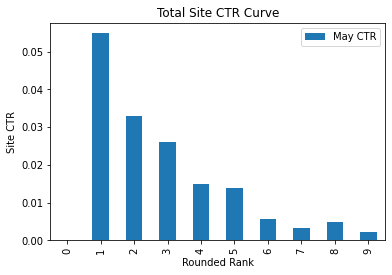

In [83]:
ax = ctr_pivot.head(10).plot(kind='bar')
ax.set_ylabel('Site CTR')
ax.set_title('Total Site CTR Curve')

##### Brand

In [84]:
brand_ctr_pivot = cln[cln["Brand vs Non"]=="Brand"].pivot_table(index=('Rounded Rank'), values=['May CTR'], aggfunc={'May CTR':"mean"}).sort_values(by=['Rounded Rank'], ascending=True)
brand_ctr_pivot.head(10)

,May CTR
Rounded Rank,
0,0.000000
1,0.130856
2,0.060007
3,0.046344
4,0.028295
5,0.015421
6,0.006778
7,0.004393
8,0.006268


Text(0.5, 1.0, 'Brand Site CTR Curve')

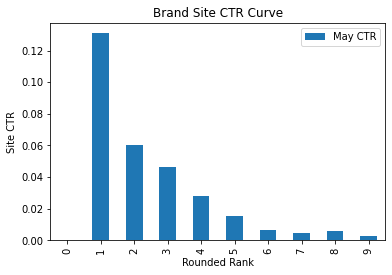

In [85]:
ax_brand = brand_ctr_pivot.head(10).plot(kind='bar')
ax_brand.set_ylabel('Site CTR')
ax_brand.set_title('Brand Site CTR Curve')

In [86]:
nonbrand_ctr_pivot = cln[cln["Brand vs Non"]=="Non-Brand"].pivot_table(index=('Rounded Rank'), values=['May CTR'], aggfunc={'May CTR':"mean"}).sort_values(by=['Rounded Rank'], ascending=True)
nonbrand_ctr_pivot.head(10)

,May CTR
Rounded Rank,
0,0.000000
1,0.011125
2,0.017035
3,0.012526
4,0.005172
5,0.012817
6,0.005048
7,0.002326
8,0.003946


Text(0.5, 1.0, 'Non-Brand Site CTR Curve')

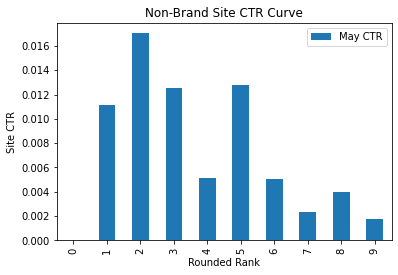

In [87]:
ax_brand = nonbrand_ctr_pivot.head(10).plot(kind='bar')
ax_brand.set_ylabel('Site CTR')
ax_brand.set_title('Non-Brand Site CTR Curve')

### Ranking Distribution

##### Total Site

In [111]:
#Drop lost keywords = 0 Rounded Rank
cln.drop(cln.loc[cln['Rounded Rank'] ==0].index, inplace=True)

In [116]:
rank_pivot = cln.pivot_table(index=('Rounded Rank'), values=['Query'], aggfunc={'Query':"count"}).sort_values(by=['Rounded Rank'], ascending=True)
rank_pivot.head(20)

,Query
Rounded Rank,
1,994
2,339
3,273
4,291
5,351
6,492
7,662
8,1107
9,1080


Text(0.5, 1.0, 'Total Ranking Distribution')

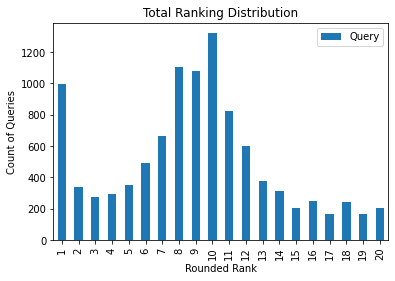

In [117]:
ax = rank_pivot.head(20).plot(kind='bar')
ax.set_ylabel('Count of Queries')
ax.set_title('Total Ranking Distribution')

##### Brand

In [118]:
brand_ranking_pivot = cln[cln['Brand vs Non']=='Brand'].pivot_table(index=('Rounded Rank'), values=['Query'], aggfunc={'Query':"count"}).sort_values(by=['Rounded Rank'], ascending=True)
brand_ranking_pivot.head(20)

,Query
Rounded Rank,
1,363
2,126
3,110
4,124
5,146
6,208
7,290
8,504
9,440


Text(0.5, 1.0, 'Brand Ranking Distribution')

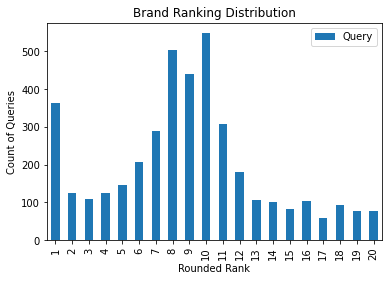

In [119]:
ax = brand_ranking_pivot.head(20).plot(kind='bar')
ax.set_ylabel('Count of Queries')
ax.set_title('Brand Ranking Distribution')

##### Non-Brand

In [113]:
non_brand_ranking_pivot = cln[cln['Brand vs Non']=='Non-Brand'].pivot_table(index=('Rounded Rank'), values=['Query'], aggfunc={'Query':"count"}).sort_values(by=['Rounded Rank'], ascending=True)
non_brand_ranking_pivot.head(20)

,Query
Rounded Rank,
1,631
2,213
3,163
4,167
5,205
6,284
7,372
8,603
9,640


Text(0.5, 1.0, 'Non-Brand Ranking Distribution')

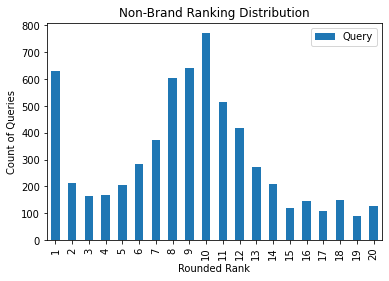

In [114]:
ax = non_brand_ranking_pivot.head(20).plot(kind='bar')
ax.set_ylabel('Count of Queries')
ax.set_title('Non-Brand Ranking Distribution')

#####Big opportunity for rank 8-12 keywords above!!!